# Patient Diagnosis with Machine Learning
Caitlin Ruble


## Introduction
### Problem: 
For a sick patient, the pathway to feeling better begins with an accurate diagnosis. Doctors are the first line responders to assess a patient’s symptoms, categorize the patient with a diagnosis, and then create a treatment plan based on that diagnosis. While this approach can, and often does work, and has been the approach for the entirety of the history of medicine, it does require doctors to hold vast amounts of memorized knowledge, doesn’t account for emerging diseases, and is at the mercy of human error. When ailments are misdiagnosed, patients suffer and cannot get the treatment they need. At best, they suffer for longer than they need to, and at worst their ailments can lead to permanent disabilities and even death. What if we could leverage all the canonical knowledge of the field of medicine and ask a machine to hold on to that for us, instead of relying on individual doctors to memorize and apply their knowledge perfectly? If we could build a machine learning model that correctly classified a patients diagnosis based on their presenting symptoms, we could save lives and reduce suffering by ensuring timely, accurate diagnoses, thus leading to timely, appropriate treatment. This is the problem we sought to solve!

### Client:
Such a classifier would add monetized value to many entities across the medical industry. Patients who receive an accurate diagnosis and appropriate treatment the first time around will avoid unnecessary medical charges related to treating a misdiagnosis and are likelier to stay out of emergency situations related to their ailment. This equates to significant cost savings for hospital systems, health insurance providers, and other medical provider agencies, all while delivering better outcomes for patients.

### Dataset:
The ["Disease Prediction Using Machine Learning"](https://www.kaggle.com/datasets/kaushil268/disease-prediction-using-machine-learning) dataset on Kaggle contains symptom data for 4920 individual observations. There are 132 binary symptom features, and a “prognosis” feature which holds the disease classification label.

### Approach:
I will use several supervised machine learning techniques and select the best-performing one to build a classifier that can accurately classify a patients diagnosis from the set of diseases included in the dataset, based on the presence/absence of the included symptoms, with >95% accuracy. 

## Data Wrangling

In [1]:
#Import pandas, matplotlib.pyplot, numpy, and seaborn 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
%matplotlib inline
import warnings

In [2]:
#import training csv file into a pandas DataFrame as 'train'
train = pd.read_csv('Training.csv', sep=',')

#import testing csv file into a pandas DataFrame as 'test'
test = pd.read_csv('Testing.csv', sep=',')

Find Shape and descriptive characteristics of df

In [3]:
#print info
print(train.info())

print(test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4920 entries, 0 to 4919
Columns: 134 entries, itching to Unnamed: 133
dtypes: float64(1), int64(132), object(1)
memory usage: 5.0+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42 entries, 0 to 41
Columns: 133 entries, itching to prognosis
dtypes: int64(132), object(1)
memory usage: 43.8+ KB
None


The test info provided through kaggle only has 42 instances, which is not enough to reasonably test on. I'm going to concatenate these entries in with the "training" data, suffle the resulting DataFrame, and consider the data as a whole. I'll split this into training/testing sets down the line, after cleaning.

In [4]:
#concatenate train and test into one df, 'data'
data = pd.concat([train,test])

#check info to verify success
print(data.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4962 entries, 0 to 41
Columns: 134 entries, itching to Unnamed: 133
dtypes: float64(1), int64(132), object(1)
memory usage: 5.1+ MB
None


In [5]:
#import shuffle utility from sklearn
from sklearn.utils import shuffle

#shuffle 'data' to homogenize afer concatenating
data = shuffle(data)

#reset index for shuffled rows
data.reset_index(drop=True, inplace=True)

#print data head
data.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis,Unnamed: 133
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Hepatitis B,NaN
1,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Drug Reaction,NaN
2,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,Drug Reaction,NaN
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Diabetes,NaN
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Hypothyroidism,NaN


In [6]:
#print sorted list of feature names
sorted(list(data.columns))

['Unnamed: 133',
 'abdominal_pain',
 'abnormal_menstruation',
 'acidity',
 'acute_liver_failure',
 'altered_sensorium',
 'anxiety',
 'back_pain',
 'belly_pain',
 'blackheads',
 'bladder_discomfort',
 'blister',
 'blood_in_sputum',
 'bloody_stool',
 'blurred_and_distorted_vision',
 'breathlessness',
 'brittle_nails',
 'bruising',
 'burning_micturition',
 'chest_pain',
 'chills',
 'cold_hands_and_feets',
 'coma',
 'congestion',
 'constipation',
 'continuous_feel_of_urine',
 'continuous_sneezing',
 'cough',
 'cramps',
 'dark_urine',
 'dehydration',
 'depression',
 'diarrhoea',
 'dischromic _patches',
 'distention_of_abdomen',
 'dizziness',
 'drying_and_tingling_lips',
 'enlarged_thyroid',
 'excessive_hunger',
 'extra_marital_contacts',
 'family_history',
 'fast_heart_rate',
 'fatigue',
 'fluid_overload',
 'fluid_overload.1',
 'foul_smell_of urine',
 'headache',
 'high_fever',
 'hip_joint_pain',
 'history_of_alcohol_consumption',
 'increased_appetite',
 'indigestion',
 'inflammatory_nails'

There are two issues in the column names of the raw data: the first is the "Unnamed: 133" column. The second is the presence of two features that look very similar "fluid_overload" and "fluid_overload.1". I'll note these for now and come back to them.

In [7]:
#check the number of unique diagnosis categories
print('Number of diagnoses: ' + str(len(data['prognosis'].unique())))

#check how many instances of each diagnosis there are
print(data['prognosis'].value_counts())


Number of diagnoses: 41
Fungal infection                           122
Hepatitis B                                121
Bronchial Asthma                           121
Malaria                                    121
Typhoid                                    121
Heart attack                               121
Tuberculosis                               121
Hepatitis E                                121
hepatitis A                                121
Urinary tract infection                    121
Osteoarthristis                            121
Arthritis                                  121
Migraine                                   121
Varicose veins                             121
Hypoglycemia                               121
AIDS                                       121
GERD                                       121
Allergy                                    121
Acne                                       121
(vertigo) Paroymsal  Positional Vertigo    121
Chronic cholestasis                 

Hmm, there are exactly 121 values for 40 of the disease diagnoses included in the data set, with fungal infection having one extra at 122. This indicates that this data has likely been cherry-picked and sanitized for the sake of the Kaggle excercise--not realistic. And yet, this gives us an extremely *balanced* data set that may make it possible to granulate diagnoses in our test set down to the specific diagnosis, rather than needing to group disease by type.

#### However, the fact that there are fewer instances of each class than there are features (121 observations/class v. 131 features) demonstrates an issue with the amount of data. With more features than observations will predispose any model I make to overfit. This is not good, but I'm going to proceed through the data science method despite this issue. Any modeling will be ready for when there is more data available.


I also observe some subtle typos and non-ideal formatting in the disease names. I'll fix those now.\
    hepatitis a -> Hepatitis A\
    Osteoarthristis -> Osteoarthritis\
    Dimorphic hemmorhoids(piles) -> Dimorphic hemmorrhoids (piles)\
    (vertigo) Paroymsal  Positional Vertigo -> Paroxysmal positional vertigo\
    Peptic ulcer diseae -> Peptic ulcer disease


In [8]:
#get column index for 'prognosis'
prog = data.columns.get_loc('prognosis')

#loop through instances in 'prognosis' column and replace typos/improve formatting
for i in range(len(data['prognosis'])):
    if data.iloc[i,prog] == 'hepatitis A':
        data.iloc[i,prog] = 'Hepatitis A'
    elif data.iloc[i,prog] == 'Osteoarthristis':
        data.iloc[i,prog] = 'Osteoarthritis'
    elif data.iloc[i,prog] == 'Dimorphic hemmorhoids(piles)':
        data.iloc[i,prog] = 'Dimorphic hemorrhoids (piles)'
    elif data.iloc[i,prog] == '(vertigo) Paroymsal  Positional Vertigo':
        data.iloc[i,prog] = 'Paroxysmal positional vertigo'
    elif data.iloc[i,prog] == 'Peptic ulcer diseae':
        data.iloc[i,prog] = 'Peptic ulcer disease'
  
# run to check if replacements were successful      
print(sorted(data['prognosis'].unique()))
print(data['prognosis'].value_counts())


['AIDS', 'Acne', 'Alcoholic hepatitis', 'Allergy', 'Arthritis', 'Bronchial Asthma', 'Cervical spondylosis', 'Chicken pox', 'Chronic cholestasis', 'Common Cold', 'Dengue', 'Diabetes ', 'Dimorphic hemorrhoids (piles)', 'Drug Reaction', 'Fungal infection', 'GERD', 'Gastroenteritis', 'Heart attack', 'Hepatitis A', 'Hepatitis B', 'Hepatitis C', 'Hepatitis D', 'Hepatitis E', 'Hypertension ', 'Hyperthyroidism', 'Hypoglycemia', 'Hypothyroidism', 'Impetigo', 'Jaundice', 'Malaria', 'Migraine', 'Osteoarthritis', 'Paralysis (brain hemorrhage)', 'Paroxysmal positional vertigo', 'Peptic ulcer disease', 'Pneumonia', 'Psoriasis', 'Tuberculosis', 'Typhoid', 'Urinary tract infection', 'Varicose veins']
Fungal infection                 122
Hepatitis B                      121
Bronchial Asthma                 121
Malaria                          121
Typhoid                          121
Heart attack                     121
Tuberculosis                     121
Hepatitis E                      121
Hepatitis 

Replacement with corrected names worked, and each diagnosis still has the same # of counts. 

Next, let's see what's happening with that last column, 'Unnamed: 133'

In [9]:
print(data['Unnamed: 133'].value_counts())
print(data['Unnamed: 133'].unique())

Series([], Name: Unnamed: 133, dtype: int64)
[nan]


This column only contains NaN values and gives us no information. We can safely remove this column from our DataFrame.

In [10]:
#drop NaN column Unnamed: 133
data.drop(columns=['Unnamed: 133'], inplace=True)

Now let's check for any other missing values by summing the count of NaN in each column.

In [11]:
for i in range(133):
    print(data.iloc[:,i].isna().sum())

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


The coast is clear--there are *no* missing values in the whole data set. Again, this points to very sanitized data, but makes my job quite straightforward.


Now, let's plot out the histograms to get a sense of the value distribution for each column. We expect these to be a mix of 0s and 1s.

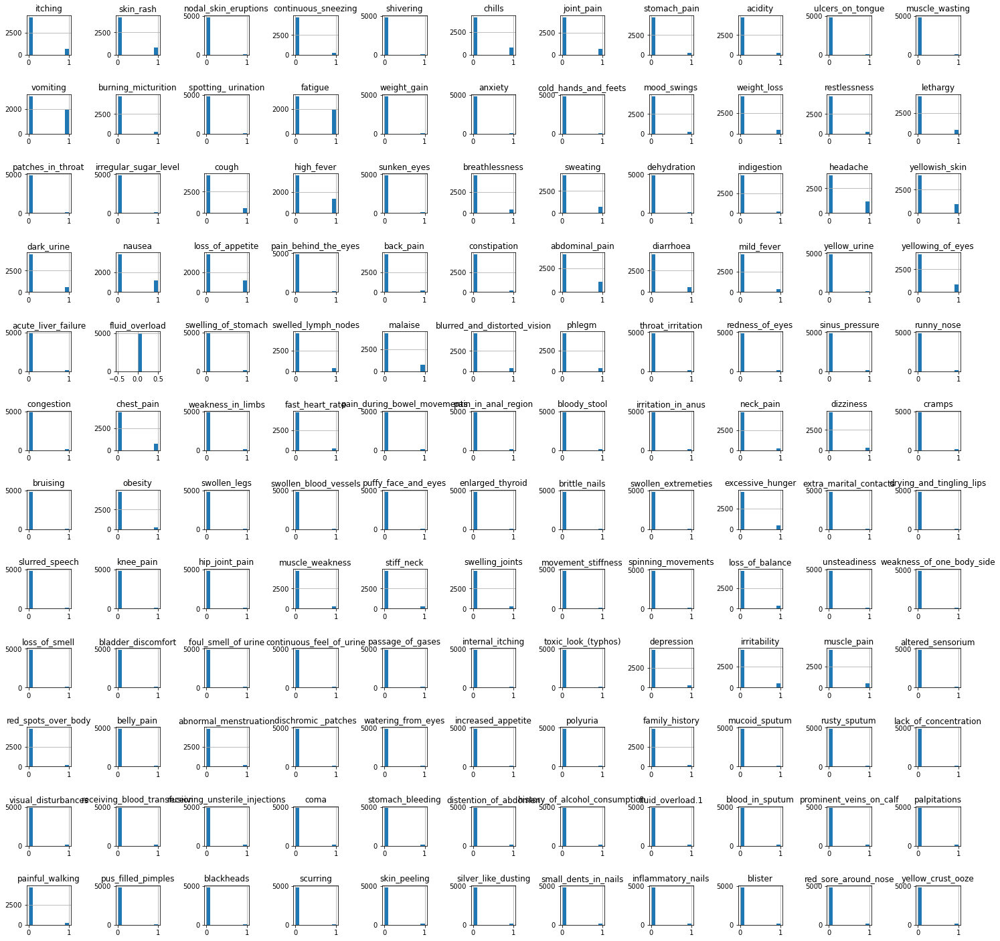

In [12]:
data.hist(figsize=(25,25))
plt.subplots_adjust(hspace=1, wspace=1);

Cool, looks like nearly every symptom column has at least a few positives in the dataset, and there are no non-binary values. 

The one exception is the "fluid overload" symptom, which contains all 0s. 

Because "fluid_overload" and "fluid_overload.1" both exist in the feature space, and "fluid_overload" contains no information, I will drop this column from the data frame and rename the "fluid_overload.1" to "fluid overload" for simplicity in interpretation and deployment use.

array([[<AxesSubplot:title={'center':'fluid_overload'}>]], dtype=object)

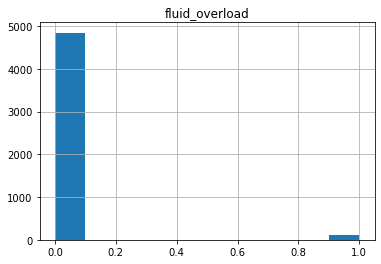

In [13]:
#drop empty, redundant fluid_overload feature
data.drop(columns='fluid_overload', inplace=True)

#rename fluid_overload.1 to simply fluid_overload for interpretability
data.rename(columns={'fluid_overload.1':'fluid_overload'}, inplace=True)

#verify success by plotting histogram of "new" fluid_overload
data.hist(column='fluid_overload')

From a visual look at the histograms, we can see the the most common symptoms include vomiting, fatigue, and high fever. 
The next tier of common symptoms includes itching, skin rash, nausea, loss of appetite, headache, yellowing of skin, yellowing of eyes, and abdominal pain.

Everything looks clean, tidy and wrangled. Let's move on to EDA.

## Exploratory Data Analysis

My goal in EDA is to understand the broad picture of which symptoms are indicated in which diagnoses, and at what frequencies. Does each disease have a unique composition of symptoms? What is the predictive power of each symptom?

In [14]:
#turn column headers into a list of all possible symptoms, to iterate through later
symptoms = np.array(data.columns)

#removes the final header "prognosis" from the symptom list
symptoms = symptoms[0:(len(symptoms)-1)] 

#create a disease list, to iterate through later. Check contents and properties for accuracy
diseases = data['prognosis'].unique()

#### In order to visualize the data in totality, I would like to create a matrix of bar charts, where symptoms are plotted grouped by disease. In order to do this, I need to reformat the data to be matplotlib friendly. After trial and error, I decide to create a new DataFrame that specifically holds the frequency counts of each symptom for each diagnosis and then plot those frequencies as bar charts, separated by diagnosis.

In [15]:
#first, I define a function to automate 
def count_symps(disease):
    disease = data[data['prognosis']==disease]
    sums = []
    for symptom in symptoms:
        sums.append(disease[symptom].sum())
    return sums

#next, I create a df to hold all the symptom count data by prognosis and iterate through each
#prognosis using the count_symps functino defined above
count_df = pd.DataFrame({'symptoms': symptoms})
for disease in diseases:
    count_df[disease] = count_symps(disease)
    
#I take a look at the count_df generated -- looks awesome!! It's ready to plot.
count_df.head()

,symptoms,Hepatitis B,Drug Reaction,Diabetes,Hypothyroidism,Peptic ulcer disease,Hepatitis D,Common Cold,Gastroenteritis,Hypertension,...,Osteoarthritis,Arthritis,Migraine,Varicose veins,Hypoglycemia,AIDS,GERD,Allergy,Acne,Cervical spondylosis
0,itching,115,115,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,skin_rash,0,109,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,115,0
2,nodal_skin_eruptions,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,continuous_sneezing,0,0,0,0,0,0,115,0,0,...,0,0,0,0,0,0,0,109,0,0
4,shivering,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,109,0,0


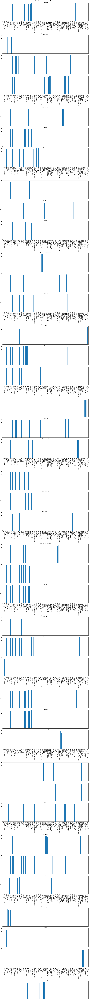

In [16]:
#create the figure and axes subplot objects and iterate through a loop to chart each disease's symptom frequency
fig, ax = plt.subplots(len(diseases),1, figsize=(20,225), sharey=True, constrained_layout=True)
fig.suptitle("Symptom Counts for Each Disease", size='xx-large')
plt.style.use('seaborn-notebook')
for i in range(len(diseases)):
    ax[i].bar(count_df['symptoms'], count_df[diseases[i]])
    ax[i].set_title(diseases[i], fontsize='large')
    ax[i].tick_params(axis='x', labelrotation = 90, labelsize = 12)
    ax[i].set_ylabel('count')
    ax[i].margins(0)
    ax[i].set_yticks([0,20,40,60,80,100,120])
    ax[i].set_xticks([])
    
#set up x labels every 3 axes subplots:
for i in range(0,len(diseases),3):
    ax[i].set_xticks(symptoms)

These charts are very informative! We can essentially see a "signature" of symptoms associated with each disease we hope to model. Each disease has a visually distinct "signature," which is promising to see.

We know that each disease can have up to 120 counts of each symptom. If a frequency bar reaches 120 (the top of the plot), then that indicates that every single instance of that disease in our training data was positive for that symptom. While this isn't exactly rare (check out the "Common cold" or "Hyperthyroidism" charts, among others, for examples), it is far more common in our data set for many, but not all, of the instances of a disease to show a particular symptom. Notice that no symptom frequency bar is less than ~100 instances out of 120. Notice also that each prognosis has multiple symtoms

In these cases, our model will likely need to look at the overall signature of symptoms in order to make an accurate classification. In cases where 100% of our samples are positive for a given symptom, our model can make use of that information in conjunction with the signature of symptoms in order to narrow down it's classification.

Here's a pared down version of the charts above showing just Common Cold, Hyperthyroidism, Osteoarthritis, Impetigo overlaid on one chart. These are meant to be demonstrative of the different symptom “signatures” of each disease in the dataset showed, and how while some symptoms are implicated in 100% of the cases of a disease, many are not. 

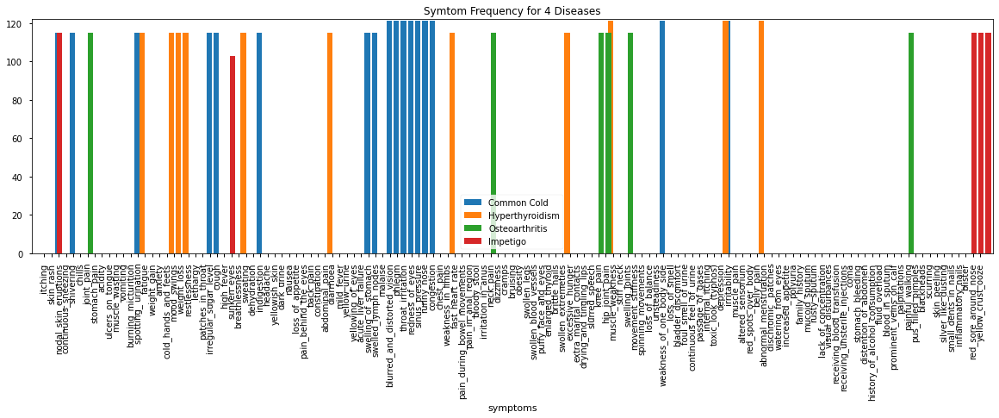

In [42]:
#making an overlaid bar chart of symptom frequency counts for demonstration purposes in documentation

to_plot=['Common Cold', 'Hyperthyroidism', 'Osteoarthritis', 'Impetigo']
ax = count_df.plot(kind = 'bar',
                   x='symptoms', 
                   y =to_plot, 
                   width=3, 
                   figsize=(20,5), 
                   legend='best', 
                   title='Symtom Frequency for 4 Diseases')
ax.set_yticks([0,20,40,60,80,100,120])
ax.set_ylim([0, 122])

plt.show()

Now, I'm curious about how fequently each symptom is associated with each of the diagnoses. I'm essentially going to plot the opposite of what I did before, this time grouping the frequency of each disease by the symptom

In [18]:
#I start by transposing my existing count DataFrame and ironing out the formatting by reassigning the first row to be the header values
symp_df = count_df.transpose() 
symp_df.rename(index = {'symptoms':'disease'},inplace=True)
symp_df.reset_index(inplace=True)
symp_df.columns = symp_df.iloc[0]
symp_df = symp_df[1:]
symp_df.head()

#ready to roll!

,disease,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,...,pus_filled_pimples,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze
1,Hepatitis B,115,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Drug Reaction,115,109,0,0,0,0,0,109,0,...,0,0,0,0,0,0,0,0,0,0
3,Diabetes,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Hypothyroidism,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,Peptic ulcer disease,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [19]:
#create the figure and axes subplot objects and iterate through a loop to chart which diseases are indicated by each symptom, and at what frequency
fig2, ax2 = plt.subplots(len(symptoms),1, figsize=(20,500), sharex=True, constrained_layout=True)
fig2.suptitle("Disease Frequency for Each Symptom", size='xx-large')
plt.style.use('seaborn-notebook')
for i in range(len(symptoms)):
    ax2[i].bar(symp_df['disease'], symp_df[symptoms[i]])
    ax2[i].set_title(symptoms[i], fontsize='large')
    ax2[i].tick_params(axis='x', labelrotation = 90, labelsize = 15)
    ax2[i].set_ylabel('count')
    ax2[i].margins(0)
    ax2[i].set_yticks([0,20,40,60,80,100,120])
    

Another informative, if somewhat overwhelming, set of frequency charts to look at! I chose to add x-axis labels every 3 charts to balance ease of interpretation with visual clutter and "busy-ness."

There are several conclusions we can draw:
   1. **some symptoms are only indicated in 1 disease prognosis.** The presence of one of these symptoms in the test set would *automatically* indicate that given disease. However, the absence of this symptom doesn't rule that prognosis out in this case.</n>
   2. **some symptoms are only indicated in 1 disease prognosis *and* are indicated in every instance of that prognosis in the training set.** Again, the presence of one of these symptoms in the test set would *automatically* indicate that given disease. The absence of this symptom would *automatically* rule that given disease out.
   3. **Some symtoms are indicated in more than one prognosis.** In these cases, the presence of that symptom can narrow down the prognosis possibilities but can't be used to draw conclusions on its own.
   4. **Some symtoms are indicated in more than one prognosis *and* are *always* indicated in one or more of the possibilities.** In these cases, the *absense* of this symptom could rule out certain prognoses.
   
   
Using the power of these insights, we have the tools we need to build a powerful classification model. 

See the plot, below, for a digestible comparison of just 4 of these symptoms.

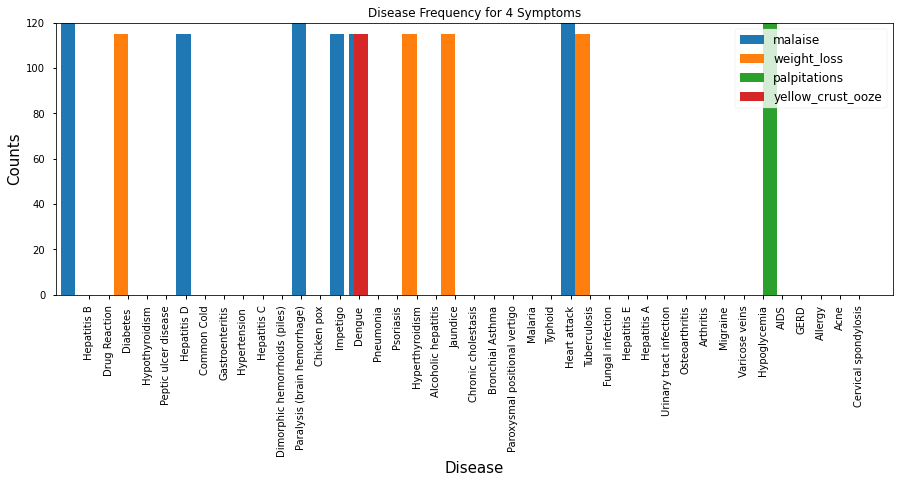

In [20]:
#making an overlaid bar chart of symptom frequency counts for demonstration purposes in documentation

to_plot=['malaise', 'weight_loss', 'palpitations', 'yellow_crust_ooze']
ax = symp_df.plot(kind = 'bar',
                   x='disease', 
                   y =to_plot, 
                   width=3, 
                   figsize=(15,5), 
                   legend='best', 
                   title='Disease Frequency for 4 Symptoms')
ax.legend(fontsize=12)
ax.set_ylabel('Counts', fontsize=15)
ax.set_xlabel('Disease', fontsize=15)
ax.set_yticks([0,20,40,60,80,100,120])
ax.set_ylim([0, 120])

plt.show()

Now that we have seen the symptom v. prognosis breakdowns and the prognosis v. symptoms breakdowns in fine detail, let's create a heatmap to give us a quick visual. Because our data set contains so many zero values, which severely dilute the heatmap colors, I chose to replace the 0s with NaNs to leave them out of the heatmap. This leaves us with clear color differentials to see which symptoms are most highly implicated in which diseases, and also allows us to clearly see those cases where every instance of a disease is positive for a given symptom.

Text(0.5, 1.0, 'Percentage of disease prognosis instances which are positive for each symptom')

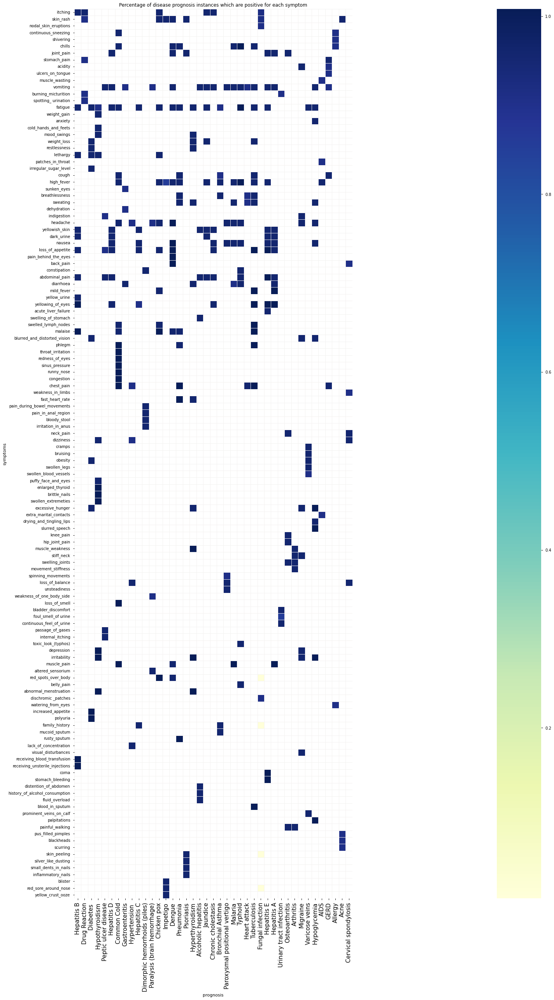

In [21]:
#let's get a heatmap view of how often each symptom is indicated in each prognosis

#convert count_df to percentages
perc_df = count_df.set_index('symptoms')/120

#cast to type float
perc_df = perc_df.astype('float')

#replace 0s with NaNs to exclude them from the heatmap
perc_df = perc_df.replace(0, np.nan) 

fig3, ax3 = plt.subplots(figsize = (133,42))
ax3 = sns.heatmap(perc_df, square=True, cmap="YlGnBu", linewidths=.5,linecolor='#F3F1F0')
ax3.tick_params(axis='x', labelsize = 15)
ax3.set_xlabel('prognosis')
ax3.set_title('Percentage of disease prognosis instances which are positive for each symptom')

We now have a very clear idea of the symptom profile for each of our 41 prognoses as well as a very clear picture of which prognoses are possible for each symptom. We know which symptoms are associated with only one prognosis and which symptoms are always included in a given prognosis. All of this information is going to enable us to build a strong model in the next step of this project!


### Predictive Power Score:
To measure the predictive power of each symptom column on the prognosis, I'm going to calculate the predictive power score (PPS) and show this as a matrix. All code is modified from https://machinelearningknowledge.ai/predictive-power-score-vs-correlation-with-python-implementation/

"The PPS is an asymmetric, data-type-agnostic score that can detect linear or non-linear relationships between two columns. The score ranges from 0 (no predictive power) to 1 (perfect predictive power). It can be used as an alternative to the correlation (matrix)." from [Predictive Power Score Documentation](https://github.com/8080labs/ppscore)

In [22]:
import ppscore as pps 

In [23]:
#calculate PPS scores for each feature column on the target variable "prognosis"
pps_matrix = pps.predictors(data, y='prognosis') 

pps_matrix

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,pain_behind_the_eyes,prognosis,0.00223,classification,True,weighted F1,0.023378,0.025555,DecisionTreeClassifier()
1,throat_irritation,prognosis,0.00223,classification,True,weighted F1,0.023378,0.025555,DecisionTreeClassifier()
2,redness_of_eyes,prognosis,0.00223,classification,True,weighted F1,0.023378,0.025555,DecisionTreeClassifier()
3,sinus_pressure,prognosis,0.00223,classification,True,weighted F1,0.023378,0.025555,DecisionTreeClassifier()
4,runny_nose,prognosis,0.00223,classification,True,weighted F1,0.023378,0.025555,DecisionTreeClassifier()
...,...,...,...,...,...,...,...,...,...
126,muscle_pain,prognosis,0.00000,classification,True,weighted F1,0.023378,0.010967,DecisionTreeClassifier()
127,red_spots_over_body,prognosis,0.00000,classification,True,weighted F1,0.023378,0.017673,DecisionTreeClassifier()
128,abnormal_menstruation,prognosis,0.00000,classification,True,weighted F1,0.023378,0.017233,DecisionTreeClassifier()
129,family_history,prognosis,0.00000,classification,True,weighted F1,0.023378,0.016895,DecisionTreeClassifier()


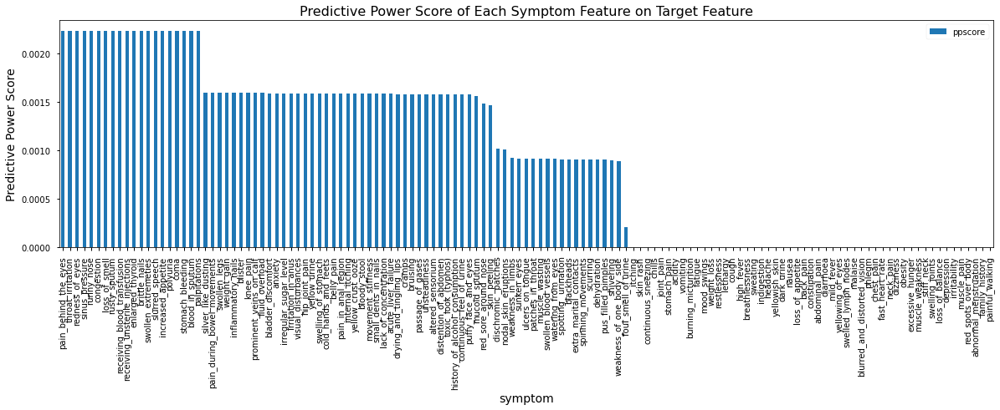

In [24]:
#visualize ppscores
pps_viz= pps_matrix.plot.bar(x='x',y='ppscore',figsize=(20,5))
pps_viz.set_xlabel('symptom', fontsize=14)
pps_viz.set_ylabel('Predictive Power Score', fontsize=14)
pps_viz.set_title('Predictive Power Score of Each Symptom Feature on Target Feature', fontsize=16)
plt.show()

In [45]:
#count number of features at each ppscore
print(pps_matrix['ppscore'].value_counts())


0.000000    51
0.002230    10
0.002230    10
0.001592     2
0.001588     2
0.001576     2
0.001577     2
0.001584     2
0.001588     2
0.001576     2
0.001588     1
0.000911     1
0.001465     1
0.001015     1
0.001007     1
0.000920     1
0.000916     1
0.000913     1
0.000913     1
0.000912     1
0.000912     1
0.000909     1
0.001591     1
0.000908     1
0.000905     1
0.000905     1
0.000905     1
0.000904     1
0.000903     1
0.000895     1
0.000887     1
0.000209     1
0.001481     1
0.001561     1
0.001573     1
0.001573     1
0.001592     1
0.001588     1
0.001588     1
0.001588     1
0.001585     1
0.001585     1
0.001585     1
0.001592     1
0.001584     1
0.001584     1
0.001584     1
0.001584     1
0.001584     1
0.001577     1
0.001577     1
0.001592     1
0.001592     1
0.001592     1
0.001592     1
0.001576     1
Name: ppscore, dtype: int64


Now that we have a strong sense of how our feature columns relate to our target variable, we are ready to move on to the Preprocessing and Feature Engineering step of the Data Science Method.

## Preprosessing and Training Data Development - Step 4 of Data Science Method

The data DataFrame is actually ready to be fed through most of sklearn's supervised learning models. The binary symptom features are already in a "one hot encoded" format, and the target feature has labeled categorical data. The models I'll be using (Decision Tree, AdaBoost, Random Forest, Gradient Boost, SVM, and XGBoostClassifier) can all handle an un-encoded categorical target feature, but I noticed that the label-encoding feature of the XGBoostClassifier is deprecated and will be removed in a later release. Because of this deprecated utility and for the sake of demonstration, I am going to label encode the target feature column of the dataset for modeling. 


In [26]:
#import LabelEncoder
from sklearn.preprocessing import LabelEncoder

#instantiate label encoder object
le = LabelEncoder()

#fit le to target feature
le.fit(data['prognosis'])

#transform target feature column and assign encoded values into original column
data['prognosis'] = le.transform(data['prognosis'])

#Note: to unencode model predictions and get their disease label, we can use le.inverse_transform

With encoding taken care of, now the last step remaining before modeling is to split our dataframe into X and y, holding the features and target respectively, and then split those into training and testing sets.

I'll use sklearn's train_test_split utility to split 80% of the data into the training set and 20% into the test set. To ensure there are equal numbers of each class in test set, I will stratify the split.

In [27]:
#import train test split utility
from sklearn.model_selection import train_test_split

#create variables X and y, which hold the feature columns and the target column, respectively

X = data.drop(columns='prognosis')
y = data['prognosis']

#Split data into training and testing sets at an 80/20 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=0, stratify=data[['prognosis']])

With our target feature label encoded and our data split into test and train sets at an 80/20 split, we are ready to move to the next step, modeling.

## Modeling - Step 5 of Data Science Method

In this section I'll endeavor to optimize and evaluate at least 5 different types of models to determine which is the best. I'll be trying out a basic decision tree, a random forest classifier, an AdaBoost classifier, an XGBoost Classifier, and a SVM classifier. 

In [28]:
#import model selection functions
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV

#import Supervised learning classifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

#import metrics functions
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score

import time
from datetime import datetime


In [29]:
#initialize a results DataFrame to hold CV measures for comparison between models:
CVresults=pd.DataFrame(columns=['Model','mean CV accuracy'])

#initialize a results DataFrame to hold measures for comparison between models
results = pd.DataFrame(columns=['Model','Accuracy','F1','Precision','Recall','Training Time (s)', 'Prediction Time (s)'])


## Decision Tree - Entropy: Randomized Search CV
Testing entropy model of tree classifier. This type of model should give a sort of baseline to compare our other results to. We won't try it "off-the-shelf" because we know this leads to massive overfitting, so we'll jump right into hyperparameter tuning and give the depth some limits.


In [30]:
#instantiate a decision tree
ent_tree = DecisionTreeClassifier(criterion = 'entropy', random_state=42)


#create param grid over which to grid search
params = {
          'max_depth': range(10,41,2),
          'min_samples_split': range(2, 403, 20),
          'min_samples_leaf': range(1,403, 20),
          'max_features': ['auto', 'sqrt'],
         }

cv_ent_tree = RandomizedSearchCV(ent_tree, params, random_state=42, n_iter = 200, cv=5)

#time the search
start_time = datetime.now()
cv_ent_tree.fit(X_train,y_train)
search_time = datetime.now() - start_time

print('Search Duration: {}'.format(search_time))
print(cv_ent_tree.best_params_)
print('mean accuracy score of best model:{}'.format(round(cv_ent_tree.best_score_,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['Entropy Tree',
                                  round(cv_ent_tree.best_score_,3)]

Search Duration: 0:00:15.045137
{'min_samples_split': 82, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 34}
mean accuracy score of best model:0.933


In [31]:
#display the decision tree classifer 
from sklearn import tree
from io import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

#graph_viz will not support the cv_tree object from above, so I'm instantiating a new instance of the DecisionTreeClassifier using the tuned parameters found by CV, above
cv_ent_tree_graph = cv_ent_tree.best_estimator_

#fit to training data
cv_ent_tree_graph.fit(X_train,y_train)

# Now we want to visualize the tree
dot_data = StringIO()

# We can do so with export_graphviz
tree.export_graphviz(cv_ent_tree_graph, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns, class_names = le.inverse_transform(cv_ent_tree.classes_))
graph = graphviz.Source(dot_data)
graph

# Alternatively for class_names use entr_model.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#update tree model to reflect the tuned hyperparameters and fit to training data
#time the duration of training the model
start_time = time.time()
ent_tree = cv_ent_tree.best_estimator_.fit(X_train,y_train)
train_time = time.time()-start_time

#Evaluate model performance on test data

# Call predict() on cv_tree with X_test passed to it, and assign the result to a variable y_pred 
#time the prediction
start_time = time.time()
y_pred = ent_tree.predict(X_test)
predict_time = time.time()-start_time


print('accuracy score: {}'.format(accuracy_score(y_test,y_pred)))

#add metrics to the results df
results.loc[len(results.index)] = ['Entropy Tree',
                                   accuracy_score(y_test,y_pred),
                                   f1_score(y_test,y_pred, average='macro'),
                                   precision_score(y_test,y_pred, average='macro'),
                                   recall_score(y_test,y_pred, average='macro'),
                                  np.round(train_time,2), np.round(predict_time,2)] 

## Decision Tree - Gini impurity: Randomized Search CV
Testing gini impurity model of tree classifier


In [32]:
#instantiate a decision tree
gini_tree = DecisionTreeClassifier(criterion = 'gini', random_state=42)

#create param grid over which to grid search
params = {
          'max_depth': range(10,41,2),
          'min_samples_split': range(2, 403, 20),
          'min_samples_leaf': range(1,403, 20),
          'max_features': ['auto', 'sqrt'],
         }

#set up search
cv_gini_tree = RandomizedSearchCV(gini_tree, params, random_state=42, n_iter = 200, cv=5)

#time the search
start_time=datetime.now()
cv_gini_tree.fit(X_train,y_train)
search_time = datetime.now() - start_time

print('Search Duration: {}'.format(search_time))
print(cv_gini_tree.best_params_)
print('mean accuracy score of best model:{}'.format(round(cv_ent_tree.best_score_,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['Gini Impurity Tree',
                                  round(cv_gini_tree.best_score_,3)]

Search Duration: 0:00:15.459449
{'min_samples_split': 82, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 34}
mean accuracy score of best model:0.933


In [33]:
#display the decision tree classifer 
from sklearn import tree
from io import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

#graph_viz will not support the cv_tree object from above, so I'm instantiating a new instance of the DecisionTreeClassifier using the tuned parameters found by CV, above
cv_gini_tree_graph = cv_gini_tree.best_estimator_

#fit to training data
cv_gini_tree_graph.fit(X_train,y_train)

# Now we want to visualize the tree
dot_data = StringIO()

# We can do so with export_graphviz
tree.export_graphviz(cv_gini_tree_graph, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns, class_names = le.inverse_transform(cv_gini_tree.classes_))
graph = graphviz.Source(dot_data)
graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#update tree model to reflect the tuned hyperparameters and fit to training data
#time the duration of training the model
start_time = time.time()
ent_tree = cv_gini_tree.best_estimator_.fit(X_train,y_train)
train_time = time.time()-start_time


#Evaluate model performance on test data

# Call predict() on cv_tree with X_test passed to it, and assign the result to a variable y_pred 
start_time = time.time()
y_pred = cv_gini_tree.predict(X_test)
predict_time = time.time()-start_time


print('accuracy score: {}'.format(accuracy_score(y_test,y_pred)))

#add metrics to the results df
results.loc[len(results.index)] = ['Gini Impurity Tree',
                                   accuracy_score(y_test,y_pred),
                                   f1_score(y_test,y_pred, average='macro'),
                                   precision_score(y_test,y_pred, average='macro'),
                                   recall_score(y_test,y_pred, average='macro'),
                                   np.round(train_time,2), np.round(predict_time,2)] 

## Random Forest Classifier: Cross Validation

In [34]:
#try the random forest classifier off the shelf

rf = RandomForestClassifier(random_state=42)

#calculate the mean accuracy score for each CV fold
avg_score = np.mean(cross_val_score(rf, X_train, y_train, cv=5))

print('mean accuracy score of off-the-shelf model: {}'.format(round(avg_score,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['RF',
                                  round(avg_score,3)]

mean accuracy score of off-the-shelf model: 1.0


The off-the-shelf Random Forest Classifier has 100% accuracy in cross-validation, no need to tune hyperparameters.

## Ada Boost Classifier: Cross Validation and Hyperparameter Tuning

In [35]:
#try off the shelf ada boosting classifier
ada = AdaBoostClassifier(random_state=42)

#calculate the mean accuracy score for each CV fold
avg_score = np.mean(cross_val_score(ada, X_train, y_train, cv=5))

print('mean accuracy score of off-the-shelf model: {}'.format(round(avg_score,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['AdaBoost',
                                  round(avg_score,3)]

mean accuracy score of off-the-shelf model: 0.23


The Ada Boosting Classifier has an off-the-shelf cross-val accuracy of just 24.4%. Let's see if hyperparameter tuning can improve this score.

In [36]:
#create param grid over which to grid search
params = {'n_estimators':range(10,151,10),
          'learning_rate': np.arange(0.1,2.1,0.5)
         }

cv_ada = GridSearchCV(ada, params, cv=5)

#time the search
start_time=datetime.now()
cv_ada.fit(X_train,y_train)
search_time = datetime.now() - start_time


print('Search Duration: {}'.format(search_time))

print(cv_ada.best_params_)
print('mean accuracy score of best model:{}'.format(round(cv_ada.best_score_,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['AdaBoost_2',
                                  round(cv_ada.best_score_,3)]

Search Duration: 0:07:36.126680
{'learning_rate': 0.1, 'n_estimators': 130}
mean accuracy score of best model:0.992


In [37]:
#because the learning rate is on the cusp of the parameter space, I'm going to do another search centered around that
#instantiate an AdaBoostClassifier
ada = cv_ada.best_estimator_

#create param grid over which to grid search
params = {'learning_rate': np.arange(0.01,0.1,0.01)
         }

cv_ada = GridSearchCV(ada, params, cv=5)

#time the search
start_time=datetime.now()
cv_ada.fit(X_train,y_train)
search_time = datetime.now() - start_time


print('Search Duration: {}'.format(search_time))

print(cv_ada.best_params_)
print('mean accuracy score of best model:{}'.format(round(cv_ada.best_score_,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['AdaBoost_3',
                                  round(cv_ada.best_score_,3)]

Search Duration: 0:01:50.347775
{'learning_rate': 0.03}
mean accuracy score of best model:0.991


Further tuning showed no improvement in the CV accuracy score. The AdaBoost model sits at 99% accuracy after hyperparameter optimization.

## RBF kernel SVM
C-Support Vector Classification.

The implementation is based on libsvm. The fit time scales at least quadratically with the number of samples and may be impractical beyond tens of thousands of samples. For large datasets consider using LinearSVC or SGDClassifier instead, possibly after a Nystroem transformer.

The multiclass support is handled according to a one-vs-one scheme.

Source: [sklearn documentation](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html?highlight=svc#sklearn.svm.SVC)

In [38]:
#Try off the shelf SVM
#instantiate the SVC
svm = SVC(random_state=42)

#calculate the mean accuracy score for each CV fold
avg_score = np.mean(cross_val_score(svm, X_train, y_train, cv=5))

print('mean accuracy score of off-the-shelf model: {}'.format(round(avg_score,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['SVM',
                                  round(avg_score,3)]


mean accuracy score of off-the-shelf model: 1.0


The off-the-shelf RBF Kernel SVM has 100% accuracy on the samples in cross validation, no need to tune hyperparameters.

## XGBoost Classifier


In [39]:
#off the shelf

#instantiate the XGBoost Classifier
xgb = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')


#calculate the mean accuracy score for each CV fold
avg_score = np.mean(cross_val_score(xgb, X_train, y_train, cv=5))

print('mean accuracy score of off-the-shelf model: {}'.format(round(avg_score,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['XGBoost',
                                  round(avg_score,3)]


mean accuracy score of off-the-shelf model: 1.0


The off-the-shelf XGBoost Classifier has 100% accuracy in cross-validation. 

## Gradient Boosting Classifier
The predecessor to XGBoost, Gradient Boosting is notoriously difficult and slow to tune. In fact, when I tried tuning hyperparameters in a different notebook, it took over 9 hours to conduct a randomizedsearchCV! Since I already have some good performing models to choose from, I *won't* do that here, but I will check to see how it performs off of the shelf.

In [41]:
#off the shelf

#instantiate a GradientBoostingClassifier
gb = GradientBoostingClassifier(random_state=42)

#calculate the mean accuracy score for each CV fold
avg_score = np.mean(cross_val_score(xgb, X_train, y_train, cv=5))

print('mean accuracy score of off-the-shelf model: {}'.format(round(avg_score,3)))

#add metrics to the CVresults df
CVresults.loc[len(CVresults.index)] = ['Gradient Boost',
                                  round(avg_score,3)]


mean accuracy score of off-the-shelf model: 1.0


Would you look at that! Off the shelf, the Gradient Boosting Classifier performs at 100% accuracy in cross validation. 

## Evaluation of CV Scores for model selection

Let's print the CVresults DataFrame, sorted by 'mean cv accuracy'.

In [46]:
CVresults.sort_values(by='mean CV accuracy', ascending=False)

,Model,mean CV accuracy
2,RF,1.000
6,SVM,1.000
7,XGBoost,1.000
8,Gradient Boost,1.000
4,AdaBoost_2,0.992
5,AdaBoost_3,0.991
1,Gini Impurity Tree,0.942
0,Entropy Tree,0.933
3,AdaBoost,0.230


Overall, there were 4 models that gave 100% accuracy in Cross Validation: the Random Forest, the SVM, the XGBoost, and the Gradient Boosting models.

This is **great**! But also *suspicious*. 100% accuracy with a model is too good to be true. Was there an issue with separating the feature matrix from the target column? Was there some other issue with the data I missed earlier on?

It's encouraging to know that at least some of the models didn't give perfect accuracy. To give ourselves a "sanity check," let's check the feature_importances_ of one of these top performing models to make sure that all looks okay.


[0.01487865 0.00745333 0.00970066 0.00519865 0.00994375 0.01069255
 0.0135107  0.00750071 0.0070042  0.00712667 0.00615726 0.01456223
 0.00795044 0.01101981 0.01446847 0.00147955 0.00179218 0.00146226
 0.00420767 0.01242529 0.00414999 0.00382029 0.00846237 0.00240723
 0.0096987  0.01288383 0.0071172  0.01152089 0.01108521 0.00966113
 0.00346979 0.0095384  0.00990966 0.01499118 0.01398431 0.01211999
 0.01060076 0.0066631  0.00401518 0.01028223 0.00888468 0.0142057
 0.0035271  0.01581907 0.00461105 0.00948544 0.00550528 0.00894243
 0.0044693  0.00462721 0.002797   0.00410706 0.00308672 0.0032863
 0.00277528 0.01470517 0.00589216 0.00796483 0.00433563 0.00788255
 0.00532749 0.00511245 0.01030076 0.00842962 0.00545043 0.00451419
 0.00330371 0.00676104 0.0010058  0.00044167 0.0036484  0.0059316
 0.00595948 0.00399257 0.0065492  0.00546065 0.00683709 0.00733768
 0.00590246 0.00940631 0.00767272 0.00514243 0.00864078 0.00737777
 0.01062453 0.00887078 0.00578124 0.00377458 0.00773762 0.0026692

Text(0, 0.5, 'Count')

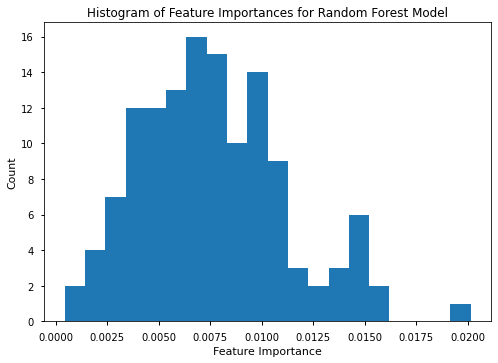

In [47]:
#calculate, show, and plot a histogram of feature importances for one of the top models, rf
#all are small numbers, indicating that there's no small set of features responsible for classification results.
rf.fit(X_train,y_train)
print(rf.feature_importances_)
print("sum of feature importances: {}".format(sum(rf.feature_importances_)))

#plot histogram of feature_importances
_ = plt.hist(rf.feature_importances_, bins=20)
plt.title('Histogram of Feature Importances for Random Forest Model')
plt.xlabel('Feature Importance')
plt.ylabel('Count')

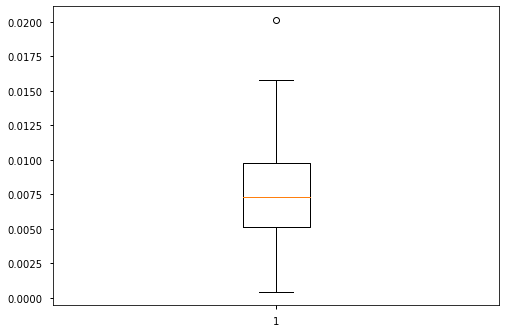

In [48]:
#plot a boxplot of the same
_=plt.boxplot(rf.feature_importances_)

Overall, this spread looks pretty reasonable--there are a couple of outlier features, but the highest importance is just over 0.02, or 2%. There is clearly no one or two features that are dominating the predictions.

As another sanity check, let's retrospectively look to see if there were duplicate rows in the dataframe:

In [49]:
#create empty list to store counts of duplicates
n_duplicates = []

#iterate over the label-encoded prognosis target to count how many of each are actually unique rows
for i in range(40):
    n_duplicates.append(len(data[data['prognosis'] == i].drop_duplicates()))
    
print(n_duplicates)
print('min unique row count:{}'.format(min(n_duplicates)))
print('max unique row count:{}'.format(max(n_duplicates)))

[5, 5, 8, 5, 6, 7, 6, 10, 8, 9, 10, 9, 6, 6, 6, 7, 5, 5, 9, 9, 7, 10, 9, 6, 9, 9, 8, 6, 9, 8, 10, 7, 5, 7, 7, 9, 7, 9, 9, 5]
min unique row count:5
max unique row count:10


Holy cow!!!!! This is a **major problem**;  

## most of this tabular medical data is composed of duplicates! 
Amongst the multiclass targets, no class has more than 10 unique observations, and some only have 5. 

No wonder these models are so "accurate"...it turns out this data is a figment of someone's imagination. Ideally, I would have caught this in the "data wrangling" stage and stopped there. Next time, I will be sure to check for duplicates at that stage, as well as ensuring data quality by verifying the source and reliability of that source on any datasets I work on.

For the sake of working through the whole data science method, I will continue through the last steps of model testing and final selection. The resulting model will be ready in the future, when more data becomes available.

Now I need to test the performance of the best models on the test set. Also calculate the time to train the model and the time to test the test set, as one more measure of model performance.

In [50]:
#random forest model on test set

#time the duration of training the model
start_time = time.time()
rf = rf.fit(X_train,y_train)
train_time = time.time()-start_time


#Evaluate model performance on test data

# Call predict() on cv_rf with X_test passed to it, and assign the result to a variable y_pred 
#time the prediction
start_time=time.time()
y_pred = rf.predict(X_test)
predict_time = time.time()-start_time


print('accuracy score: {}'.format(accuracy_score(y_test,y_pred)))

#add metrics to the results df
results.loc[len(results.index)] = ['Random Forest',
                                   accuracy_score(y_test,y_pred),
                                   f1_score(y_test,y_pred, average='macro'),
                                   precision_score(y_test,y_pred, average='macro'),
                                   recall_score(y_test,y_pred, average='macro'),
                                  np.round(train_time,2), np.round(predict_time,2)] 


accuracy score: 1.0


In [51]:
#SVM on test set

#time the duration of training the model
start_time = time.time()
svm = svm.fit(X_train,y_train)
train_time = time.time()-start_time

#Evaluate model performance on test data

# Call predict() on cv_svm with X_test passed to it, and assign the result to a variable y_pred 
#time the prediction
start_time = time.time()
y_pred = svm.predict(X_test)
predict_time = time.time()-start_time


print('accuracy score: {}'.format(accuracy_score(y_test,y_pred)))

results.loc[len(results.index)] = ['SVM with RBF kernel',
                                   accuracy_score(y_test,y_pred),
                                   f1_score(y_test,y_pred, average='macro'),
                                   precision_score(y_test,y_pred, average='macro'),
                                   recall_score(y_test,y_pred, average='macro'),
                                  np.round(train_time,2), np.round(predict_time,2)] 

accuracy score: 1.0


In [52]:
#XGBoost on the test set

#time the duration of training the model
start_time = time.time()
xgb.fit(X_train,y_train)
train_time = time.time()-start_time


#Evaluate model performance on test data

# Call predict() on xgb with X_test passed to it, and assign the result to a variable y_pred 
#time it
start_time=time.time()
y_pred = xgb.predict(X_test)
predict_time = time.time() - start_time

print('accuracy score: {}'.format(accuracy_score(y_test,y_pred)))

results.loc[len(results.index)] = ['XGBoost Classifier',
                                   accuracy_score(y_test,y_pred),
                                   f1_score(y_test,y_pred, average='macro'),
                                   precision_score(y_test,y_pred, average='macro'),
                                   recall_score(y_test,y_pred, average='macro'),
                                  np.round(train_time,2), np.round(predict_time,2)] 

accuracy score: 1.0


In [53]:
#gradient Boosting on the test set

#time the duration of training the model
start_time = time.time()
gb = gb.fit(X_train,y_train)
train_time = time.time()-start_time


#Evaluate model performance on test data

# Call predict() on cv_rf with X_test passed to it, and assign the result to a variable y_pred 
#time it
start_time=time.time()
y_pred = gb.predict(X_test)
predict_time = time.time() - start_time


print("Accuracy:", accuracy_score(y_test,y_pred))

results.loc[len(results.index)] = ['Gradient Boosted Decision Tree',
                                   accuracy_score(y_test,y_pred),
                                   f1_score(y_test,y_pred, average='macro'),
                                   precision_score(y_test,y_pred, average='macro'),
                                   recall_score(y_test,y_pred, average='macro'),
                                  np.round(train_time,2), np.round(predict_time,2)] 

Accuracy: 1.0


## Conclusions and Model Selection

Let's print the results DataFrame, sorted by Accuracy Score. We'll also add a feature, Prediction Time per Sample, which is the prediction time divided by the n. samples in the test set (992).

In [54]:
results['Prediction Time per Patient (ms)'] = results['Prediction Time (s)']/992*1000
results.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,F1,Precision,Recall,Training Time (s),Prediction Time (s),Prediction Time per Patient (ms)
0,Random Forest,1.0,1.0,1.0,1.0,1.01,0.09,0.090726
1,SVM with RBF kernel,1.0,1.0,1.0,1.0,0.49,0.11,0.110887
2,XGBoost Classifier,1.0,1.0,1.0,1.0,29.32,0.02,0.020161
3,Gradient Boosted Decision Tree,1.0,1.0,1.0,1.0,55.64,0.10,0.100806


The 4 models that gave 100% accuracy during cross-validation also gave 100% accuracy on the test data. This also means the F1 score, precision, and recall for these 4 models were all 1.0. 

These too-good-to-be-true metrics are an artifact of the poor quality of the original data source.

In order to make a conclusion about which model is "the best," we need to compare a different metric: the time to train the model and predict on samples. These measures would come into play in a production setting.

If we deploy a model that continuously retrains every time new data comes in, then we'd really value having a low training time. Because this is a medical diagnostic tool, we would probably retrain in careful batches to maintain control over the model, so training time is less important. **Amongst the top performing models, the SVC Classifier has the shortest training time (in this case, 0.49 s) and therefore wins by this measure.**

What we're most interested in is the prediction time--which model can take new data and predict a class label the quickest. We can look to the "Prediction Time Per Patient(ms) column of the table for this metric. **Here, the XGBoost Classifier wins, having the quickest run time for predicting a single occurence at 0.02 ms.**

Overall, we have four great choices that produce 100% accuracy on the held-out testing set. The model chosen would depend on how the model is deployed: the XGBoost Classifer has the quickest prediction time, but 60x the training time compared to the SVC model. The training time might be prohibitively slow for retraining the model as the quantity of data increases, as it would in a production environment. This could potentially be offset by utilizing XGBoost's parallel processing feature in a production environment, however that would take additional resources, and I'm inclined to err on the side of keeping it simple because we can! Sitting in the middle of the SVC and XGBoost models is the unassuming, powerful Random Forest model.  **Random Forest blends great prediction time (0.09 ms per patient) with a low training time (1.01s). By this logic, I deem it "the best" model and my recommended choice moving forward.


## Next Steps

The off-the-shelf machine learning models in sklearn by and large did amazingly well in predicting patient diagnoses in our testing data. The 100% accuracy score is too good to be true in actual industry settings; upon investigation it was determined that the data was most-likely poorly-generated synthetic data and definitely was composed of mostly repeated observations. Therefore, this modeling process should be taken as **proof of concept** that such a diagnostic tool *can* be built to make accurate diagnoses, but further revision and testing with real patient data is absolutely required. Some extensions I'd love to take this next include:
   - using real patient data with these models; getting as many observations as possible, and retraining the chosen model with extensive real-world data.
   
   - When pushing such a model through to production, we'd need to make sure to use inverse_transform on the predicted values to return the interpretable disease names rather than label encoded values
   
   - explore targeting diagnoses that have very similar symptoms and therefore are more difficult for a doctor to differentiate. Explore adding in more-nuanced features, such as continuously valued test results or imaging features.
   
   - Extending this type of modeling into a recommender system or using predict_proba in sklearn to return a series of possible diagnoses with associated probabilities could help the diagnostic tool to be more readily accepted by practicing medical professionals. After all, diagnosis has been an art form, and diagnosticians are unlikely to happily give that up. However, a useful tool that could return several likely diagnoses in order of probability would still give the diagnostician some space for human interpretation. This would be good at least in the beginning of using such a tool, until widespread trust and proven effectiveness can be established with real patient data. ;)